# Figure Plots
##### An organotypic atlas of human vascular cells

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import scipy.io
import matplotlib.pyplot as plt
import os
import anndata

In [2]:
import matplotlib
import seaborn as sns
from matplotlib import colors
from matplotlib import colors
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib.pyplot import rc_context
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.colors as mcolors

In [3]:
sc.logging.print_versions()

-----
anndata     0.8.0
scanpy      1.8.2
sinfo       0.3.1
-----
PIL                         9.2.0
anndata                     0.8.0
asciitree                   NA
asttokens                   NA
backcall                    0.2.0
beta_ufunc                  NA
binom_ufunc                 NA
bottleneck                  1.3.5
cffi                        1.15.1
cloudpickle                 2.0.0
colorama                    0.4.5
cycler                      0.10.0
cython_runtime              NA
cytoolz                     0.11.0
dask                        2022.7.0
dateutil                    2.8.2
debugpy                     1.5.1
decorator                   5.1.1
entrypoints                 0.4
executing                   0.8.3
fasteners                   0.18
fsspec                      2022.7.1
h5py                        3.7.0
hypergeom_ufunc             NA
igraph                      0.9.11
ipykernel                   6.15.2
jedi                        0.18.1
jinja2                   

In [4]:
sc.settings.set_figure_params(dpi=200,fontsize=15)

In [5]:
adata = sc.read_h5ad('/rds/general/user/snb20/projects/cardiac_single_cell_biology/live/Endothelial_datasets/data_analyzed/sanger_datasets/adult18_vas_20230622_SNB.h5ad')

/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


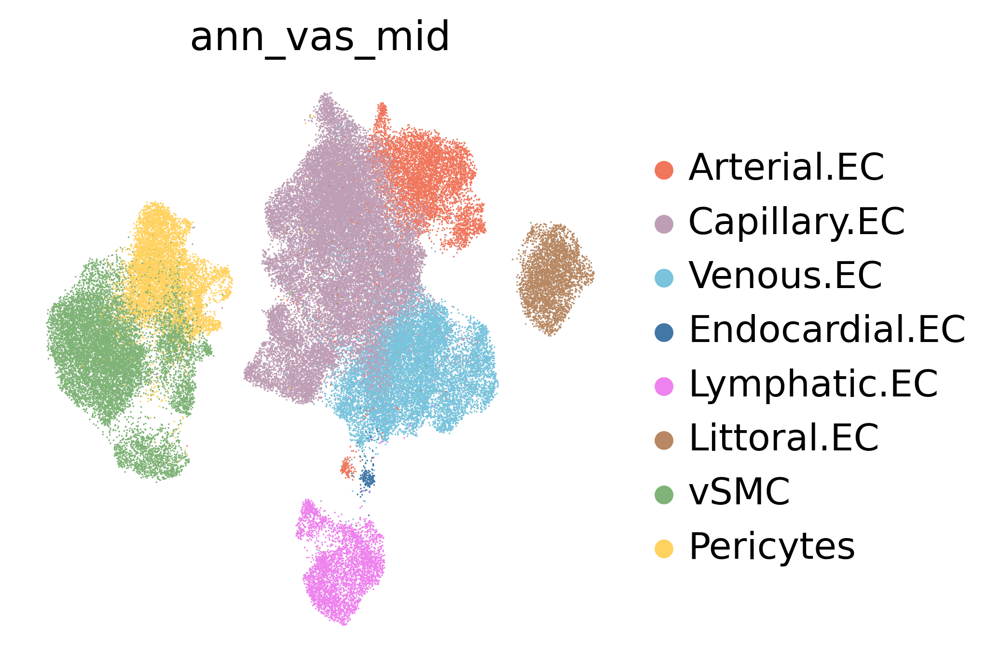

In [6]:
sc.pl.umap(adata, color = 'ann_vas_mid', palette = ["#F0765C","#BE9EB5","#79C3DC","#4277A6","violet","#B78863","#7FB377","#FFD260"], frameon = False)

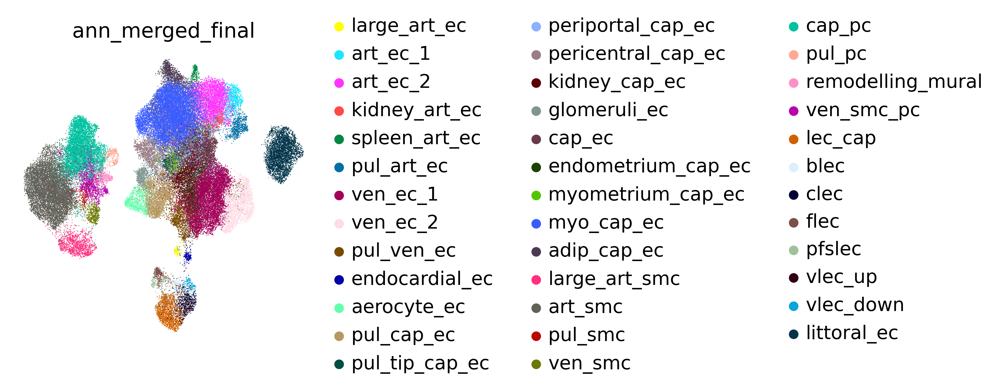

In [7]:
sc.pl.umap(adata, color = 'ann_merged_final', frameon = False)

## cell type DEG analysis

In [8]:
sc.tl.rank_genes_groups(adata,groupby='ann_vas_mid', method='wilcoxon',corr_method='benjamini-hochberg', pts = True) #change grouby accordingly. Change n_genes accordingly to the number of DE genes you want

In [9]:
df = sc.get.rank_genes_groups_df(adata, group = None)

In [10]:
df

,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference
0,Arterial.EC,SRGN,95.770042,2.962879,0.0,0.0,0.934070,0.563226
1,Arterial.EC,TM4SF1,75.953735,2.275492,0.0,0.0,0.948035,0.683934
2,Arterial.EC,SLC9A3R2,72.150688,2.367380,0.0,0.0,0.908899,0.579631
3,Arterial.EC,SEMA3G,71.623940,4.221558,0.0,0.0,0.605554,0.066991
4,Arterial.EC,SRP14,69.136314,1.260275,0.0,0.0,0.946249,0.883781
...,...,...,...,...,...,...,...,...
251211,Pericytes,RNASE1,-94.037849,-7.177376,0.0,0.0,0.020427,0.664807
251212,Pericytes,TM4SF1,-94.292625,-4.052627,0.0,0.0,0.200885,0.763777
251213,Pericytes,PECAM1,-98.415031,-8.292391,0.0,0.0,0.011059,0.689153
251214,Pericytes,CD74,-101.025154,-7.261734,0.0,0.0,0.033958,0.717119


In [11]:
df.to_csv("wilcox_ann_vas_mid_DEG.csv")

## cell state DEG analysis

In [38]:
sc.tl.rank_genes_groups(adata,groupby='ann_merged_final', method='wilcoxon',corr_method='benjamini-hochberg', pts = True) #change grouby accordingly. Change n_genes accordingly to the number of DE genes you want

/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.1

In [39]:
df = sc.get.rank_genes_groups_df(adata, group = None)

In [40]:
df

,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference
0,adip_cap_ec,FABP4,67.088791,6.121500,0.000000e+00,0.000000e+00,0.998205,0.440645
1,adip_cap_ec,CD36,63.800907,4.508222,0.000000e+00,0.000000e+00,0.994016,0.425731
2,adip_cap_ec,CD300LG,62.079887,5.507806,0.000000e+00,0.000000e+00,0.927588,0.108282
3,adip_cap_ec,BTNL9,61.146629,4.558465,0.000000e+00,0.000000e+00,0.962896,0.286249
4,adip_cap_ec,RBP7,55.815395,4.048810,0.000000e+00,0.000000e+00,0.935966,0.286647
...,...,...,...,...,...,...,...,...
1193271,vlec_up,IFI27,-10.802041,-4.413827,3.366350e-27,4.228405e-24,0.232323,0.717162
1193272,vlec_up,EPAS1,-11.941607,-4.689888,7.182199e-33,1.503569e-29,0.151515,0.745474
1193273,vlec_up,A2M,-12.153646,-4.019603,5.486260e-34,1.230568e-30,0.222222,0.795732
1193274,vlec_up,SPARC,-12.367372,-7.766042,3.924555e-35,1.026991e-31,0.030303,0.726657


In [41]:
df.to_csv("wilcox_cell_state_fine_DEG.csv")

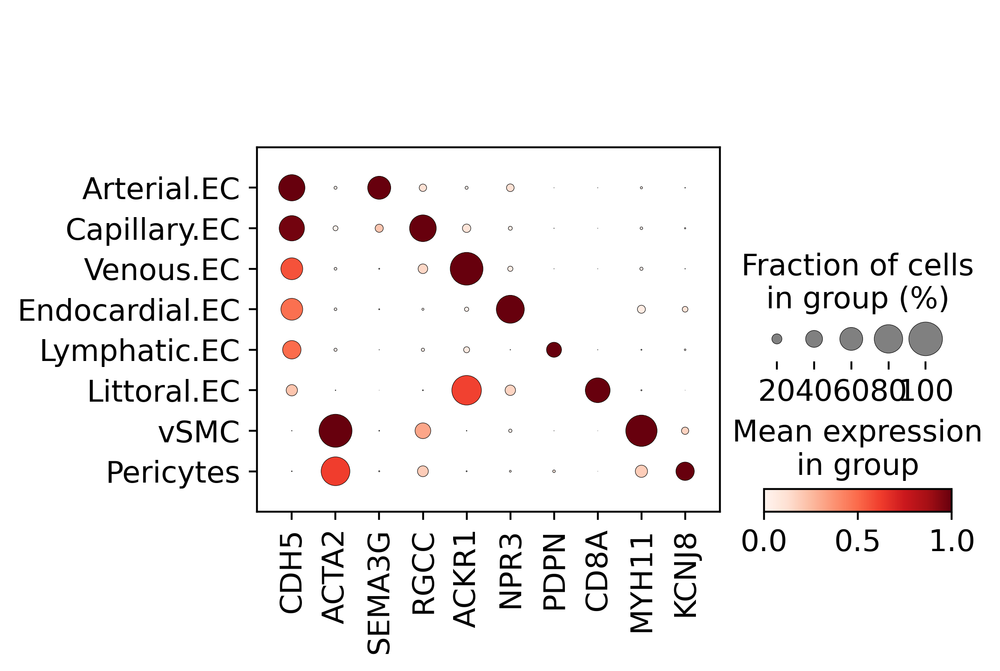

In [12]:
markers = ["CDH5","ACTA2","SEMA3G","RGCC","ACKR1","NPR3","PDPN","CD8A","MYH11","KCNJ8"]
sc.pl.dotplot(adata, markers, "ann_vas_mid", cmap = 'Reds', standard_scale = 'var')

In [13]:
markers = {
    'misc': ["TMEM88","CLEC14A","EGFL7"],
    'pan_ec': ["PECAM1","VWF","CDH5","EGFL7"],
    'pan_art_markers': ["SEMA3G","HEY1","DLL4","GJA5"],
    'large_art_ec': ["BGN","OMD","OGN","EFEMP1"],
    'art_ec_1': ["ELN","SULF1","COL8A1","ABI3BP","GUCY1A1","SSTR1"],
    'art_ec_2': ["NEBL","NTRK2","ALPL"],
    'kidney_art_ec': ["PI16","CHRM3","SLC6A6"],
    'spleen_art_ec': ["SERPINA5","NR5A1","NOX5"],
    'pul_art_ec': ["DKK2","NPR3","VIPR1","NOS1"],
    'pan_venous_markers': ["ACKR1","NR2F2","PLVAP","POSTN","COL15A1"],
    'ven_ec_1': ["POSTN","C7","SELP"],
    'ven_ec_2': ["SELE","ICAM4","CSF3","PCDH19"],
    'pul_ven_ec': ["PLA1A","PTGDS","HDAC9","IL7R"],
    'endocardial_ec': ["SMOC1","INHBA","CGNL1"],
    'aerocyte_ec': ["FOXF1","HPGD","EDNRB","SOSTDC1"],
    'pul_cap_ec': ["SLC6A4","IL7R"],
    'pul_tip_cap_ec': ["PGF","CXCR4","ESM1","CYTL1"],
    'periportal_cap_ec': ["MGP","AQP1","CLEC14A","NFATC1","PDE4B","MEG3"],
    'pericentral_cap_ec': ["CLEC1B","CLEC4G","CLEC4M","FCN2","MAF","NR2F1","CD4"],
    'kidney_cap_ec': ["IGFBP5","CEACAM1"],
    'glomeruli_ec': ["EHD3","MEG3","SOST"],
    'endometrium_cap_ec': ["APCDD1","SNCA","HOXD9"],
    'myometrium_cap_ec': ["SERPINE1","CXCL8","ELL2","TNIP2"],
    'myo_cap_ec': ["FABP5","MEOX2","TCF15"],
    'adip_cap_ec': ["LIPE","ACACB","PPARG"],
    'pan_mural': ["PDGFRB","NOTCH3","TPM2"],
    'smc_markers': ["MYH11","PLN","LMOD1"],
    'large_art_smc': ["ADH1B","THBS2"],
    'art_smc': ["RERGL","CASQ2","KCNAB1"],
    'pul_mural': ["TCF21","EGFL6","PERP"],
    'pul_smc': ["ELN","LTBP2","MYH10","FST"],
    'ven_smc': ["PRUNE2","HMCN2","FLNC","CYFIP2"],
    'pc_markers': ["RGS5","ABCC9","KCNJ8","HIGD1B"],
    'cap_pc': ["AGT","CYGB"],
    'pul_pv': ["PTN","KCNK3","LAMC3"],
    'remodelling_mural': ["FBLN1","CLEC2B","CFD"],
    'ven_smc_pc': ["STEAP4","PROCR","FGF7","CLSTN2"],
    'pan_lec': ["PROX1","TFF3"],
    'lec_cap': ["LYVE1","PDPN","EEF1G","PLA1A","C7"],
    'blec/clec': ["ACKR4","TMEM100","THBS4","PCDH15","SCUBE2"],
    'flec/pfslec': ["CCL14","CLEC4M","CLEC4G","LYZ","CXCL3","PLVAP","THY1","MARCO","CD209","LGMN"],
    'vlec_up/down': ["CLDN11","NEO1","CD24","GJA4","SCG3","DEGS2","HGF"],
    'littoral_ec': ["CD8A","KAZN","SERPINA5","NR5A1"]
}

In [14]:
sc.pl.matrixplot(adata, markers, "ann_merged_final", cmap = 'Reds', standard_scale = 'var')

## Arterial / Venous EC

In [15]:
adata_ec = adata[adata.obs["ann_vas_broad"].isin(["BEC","Endocardium"])]

In [16]:
adata_ec.obs["ann_merged_ec"] = adata_ec.obs["ann_merged_final"].copy()

/var/tmp/pbs.8548809.pbs/ipykernel_3135920/2928834170.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_ec.obs["ann_merged_ec"] = adata_ec.obs["ann_merged_final"].copy()


In [17]:
adata_ec

AnnData object with n_obs × n_vars = 47159 × 31402
    obs: 'id', 'organ', 'donor', 'kit', 'sorting', 'location', 'age', 'gender', 'dissociation', 'scrublet_score', 'doublet_bh_pval', 'published_annotation', 'HCA', 'batch', 'study', 'sample', 'cell_ontology_class', 'free_annotation', 'compartment', 'age2', 'barcode', 'concat_sample_no', 'Population ', 'hospital_id', 'Organ', 'doublet_pval', 'Project', 'broad_celltype', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'int_or_ext', 'leiden_scVI', 'organ_uni', 'uni_index', 'subsample', 'donor_organ', 'donor_location', 'numbering', 'ann_ec_2', 'scoring_cc_s', 'scoring_cc_m', 'scoring_cc', 'score_s_genes', 'score_g2m_genes', 'score_angio_genes', 'score_EMT_genes', 'score_MET_genes', 'score_stress_genes', 'ann_ec_av', 'ann_ec_size', 'ann_ec_cap', 'ann_ec_final', 'test', 'ann_vas_1', 'published_annotation_skin', 'int_ext', 'Cell_category', 'Predicted_labels_CellTypist', 'Majority_vo

In [18]:
adata_ec.obs['ann_merged_ec'] = adata_ec.obs['ann_merged_ec'].replace('myo_cap_ec','capillary ec')
adata_ec.obs['ann_merged_ec'] = adata_ec.obs['ann_merged_ec'].replace('cap_ec','capillary ec')
adata_ec.obs['ann_merged_ec'] = adata_ec.obs['ann_merged_ec'].replace('pul_cap_ec','capillary ec')
adata_ec.obs['ann_merged_ec'] = adata_ec.obs['ann_merged_ec'].replace('endometrium_cap_ec','capillary ec')
adata_ec.obs['ann_merged_ec'] = adata_ec.obs['ann_merged_ec'].replace('adip_cap_ec','capillary ec')
adata_ec.obs['ann_merged_ec'] = adata_ec.obs['ann_merged_ec'].replace('pericentral_cap_ec','capillary ec')
adata_ec.obs['ann_merged_ec'] = adata_ec.obs['ann_merged_ec'].replace('myometrium_cap_ec','capillary ec')
adata_ec.obs['ann_merged_ec'] = adata_ec.obs['ann_merged_ec'].replace('aerocyte_ec','capillary ec')
adata_ec.obs['ann_merged_ec'] = adata_ec.obs['ann_merged_ec'].replace('kidney_cap_ec','capillary ec')
adata_ec.obs['ann_merged_ec'] = adata_ec.obs['ann_merged_ec'].replace('glomeruli_ec','capillary ec')
adata_ec.obs['ann_merged_ec'] = adata_ec.obs['ann_merged_ec'].replace('pul_tip_cap_ec','capillary ec')
adata_ec.obs['ann_merged_ec'] = adata_ec.obs['ann_merged_ec'].replace('periportal_cap_ec','capillary ec')

In [19]:
adata_ec.obs.ann_merged_ec.value_counts()

capillary ec      28361
ven_ec_1           8445
art_ec_2           3700
ven_ec_2           2697
pul_ven_ec         1295
art_ec_1            950
pul_art_ec          735
spleen_art_ec       406
kidney_art_ec       237
endocardial_ec      203
large_art_ec        130
Name: ann_merged_ec, dtype: int64

In [20]:
adata_ec.obs['ann_merged_ec'].cat.reorder_categories(['large_art_ec','art_ec_1',"art_ec_2","kidney_art_ec","spleen_art_ec","pul_art_ec","capillary ec","ven_ec_1","ven_ec_2","pul_ven_ec","endocardial_ec"],inplace=True)

/var/tmp/pbs.8548809.pbs/ipykernel_3135920/80255889.py:1: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  adata_ec.obs['ann_merged_ec'].cat.reorder_categories(['large_art_ec','art_ec_1',"art_ec_2","kidney_art_ec","spleen_art_ec","pul_art_ec","capillary ec","ven_ec_1","ven_ec_2","pul_ven_ec","endocardial_ec"],inplace=True)


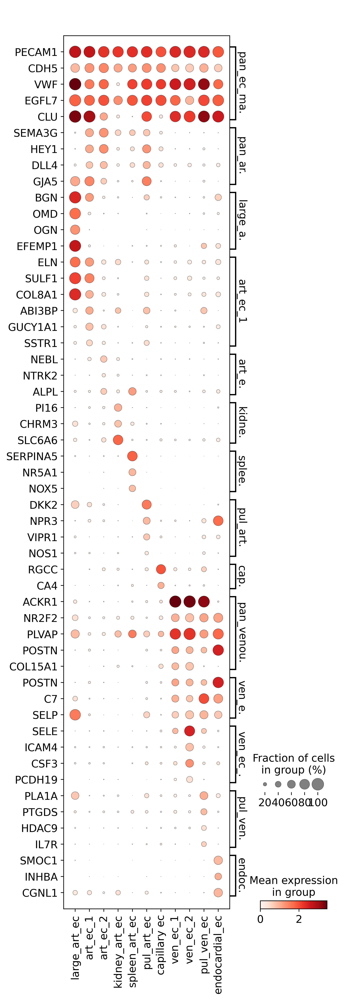

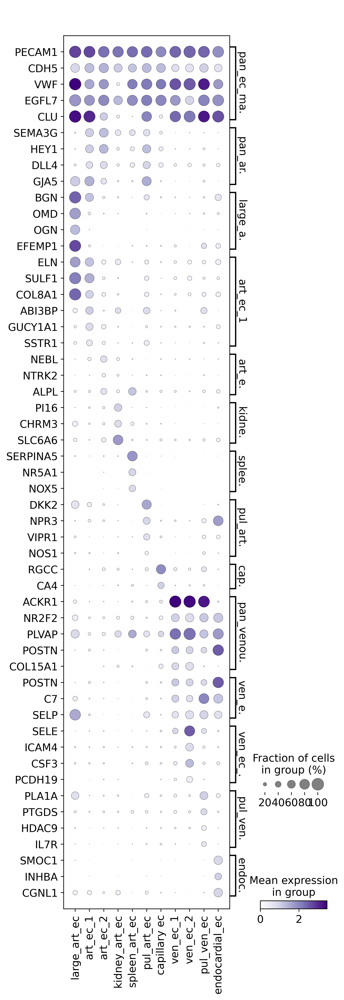

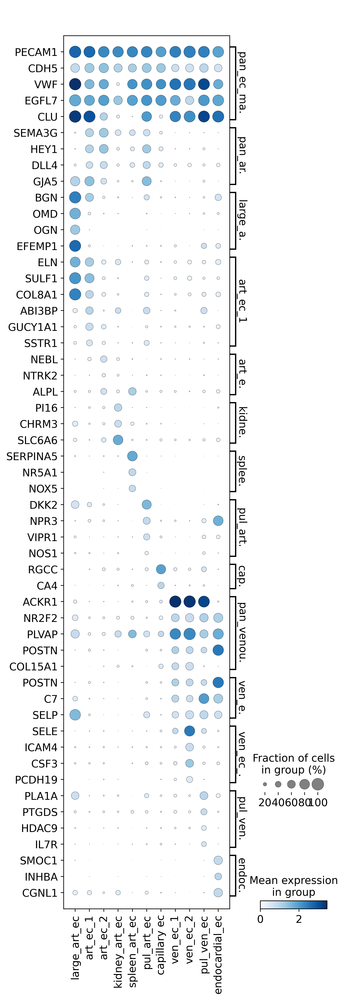

In [21]:
marker_dict = {
    'pan_ec_markers': ["PECAM1","CDH5","VWF","EGFL7","CLU"],
    'pan_art_markers': ["SEMA3G","HEY1","DLL4","GJA5"],
    'large_art_ec': ["BGN","OMD","OGN","EFEMP1"],
    'art_ec_1': ["ELN","SULF1","COL8A1","ABI3BP","GUCY1A1","SSTR1"],
    'art_ec_2': ["NEBL","NTRK2","ALPL"],
    'kidney_art_ec': ["PI16","CHRM3","SLC6A6"],
    'spleen_art_ec': ["SERPINA5","NR5A1","NOX5"],
    'pul_art_ec': ["DKK2","NPR3","VIPR1","NOS1"],
    'capillary_ec': ["RGCC","CA4"],
    'pan_venous_markers': ["ACKR1","NR2F2","PLVAP","POSTN","COL15A1"],
    'ven_ec_1': ["POSTN","C7","SELP"],
    'ven_ec_2': ["SELE","ICAM4","CSF3","PCDH19"],
    'pul_ven_ec': ["PLA1A","PTGDS","HDAC9","IL7R"],
    'endocardial_ec': ["SMOC1","INHBA","CGNL1"],
    
}
sc.pl.dotplot(adata_ec, marker_dict, "ann_merged_ec", cmap = 'Reds', swap_axes = True)
sc.pl.dotplot(adata_ec, marker_dict, "ann_merged_ec", cmap = 'Purples', swap_axes = True)
sc.pl.dotplot(adata_ec, marker_dict, "ann_merged_ec", cmap = 'Blues', swap_axes = True)

## Capillary EC

In [22]:
adata_cap = adata[adata.obs["ann_vas_mid"].isin(["Capillary.EC"])]

In [23]:
adata_cap

View of AnnData object with n_obs × n_vars = 28361 × 31402
    obs: 'id', 'organ', 'donor', 'kit', 'sorting', 'location', 'age', 'gender', 'dissociation', 'scrublet_score', 'doublet_bh_pval', 'published_annotation', 'HCA', 'batch', 'study', 'sample', 'cell_ontology_class', 'free_annotation', 'compartment', 'age2', 'barcode', 'concat_sample_no', 'Population ', 'hospital_id', 'Organ', 'doublet_pval', 'Project', 'broad_celltype', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'int_or_ext', 'leiden_scVI', 'organ_uni', 'uni_index', 'subsample', 'donor_organ', 'donor_location', 'numbering', 'ann_ec_2', 'scoring_cc_s', 'scoring_cc_m', 'scoring_cc', 'score_s_genes', 'score_g2m_genes', 'score_angio_genes', 'score_EMT_genes', 'score_MET_genes', 'score_stress_genes', 'ann_ec_av', 'ann_ec_size', 'ann_ec_cap', 'ann_ec_final', 'test', 'ann_vas_1', 'published_annotation_skin', 'int_ext', 'Cell_category', 'Predicted_labels_CellTypist', 'Maj

In [24]:
adata_cap.obs['ann_merged_final'].cat.reorder_categories(["aerocyte_ec","pul_cap_ec","pul_tip_cap_ec","periportal_cap_ec","pericentral_cap_ec","kidney_cap_ec","glomeruli_ec","cap_ec","endometrium_cap_ec","myometrium_cap_ec","myo_cap_ec","adip_cap_ec"],inplace=True)

/var/tmp/pbs.8548809.pbs/ipykernel_3135920/3773963922.py:1: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  adata_cap.obs['ann_merged_final'].cat.reorder_categories(["aerocyte_ec","pul_cap_ec","pul_tip_cap_ec","periportal_cap_ec","pericentral_cap_ec","kidney_cap_ec","glomeruli_ec","cap_ec","endometrium_cap_ec","myometrium_cap_ec","myo_cap_ec","adip_cap_ec"],inplace=True)


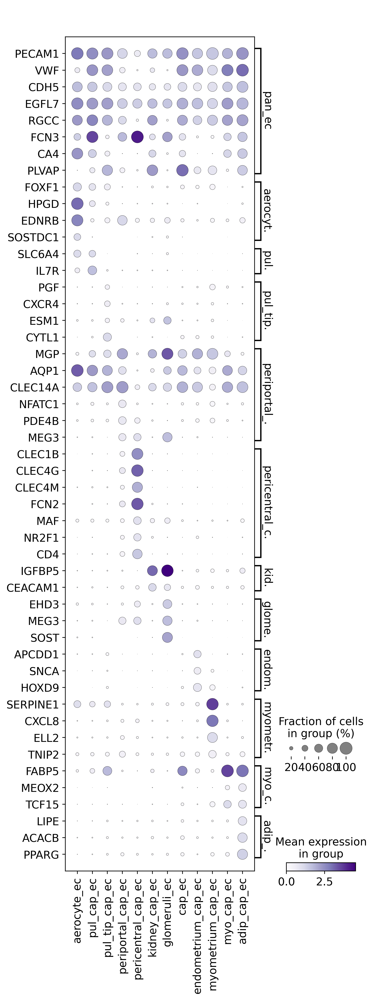

In [25]:
markers = {
    'pan_ec': ["PECAM1","VWF","CDH5","EGFL7","RGCC","FCN3","CA4","PLVAP"],
    'aerocyte_ec': ["FOXF1","HPGD","EDNRB","SOSTDC1"],
    'pul_cap_ec': ["SLC6A4","IL7R"],
    'pul_tip_cap_ec': ["PGF","CXCR4","ESM1","CYTL1"],
    'periportal_cap_ec': ["MGP","AQP1","CLEC14A","NFATC1","PDE4B","MEG3"],
    'pericentral_cap_ec': ["CLEC1B","CLEC4G","CLEC4M","FCN2","MAF","NR2F1","CD4"],
    'kidney_cap_ec': ["IGFBP5","CEACAM1"],
    'glomeruli_ec': ["EHD3","MEG3","SOST"],
    'endometrium_cap_ec': ["APCDD1","SNCA","HOXD9"],
    'myometrium_cap_ec': ["SERPINE1","CXCL8","ELL2","TNIP2"],
    'myo_cap_ec': ["FABP5","MEOX2","TCF15"],
    'adip_cap_ec': ["LIPE","ACACB","PPARG"]
}

sc.pl.dotplot(adata_cap, markers, "ann_merged_final", cmap = 'Purples', swap_axes = True)       

## Littoral EC

/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1227: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1227: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


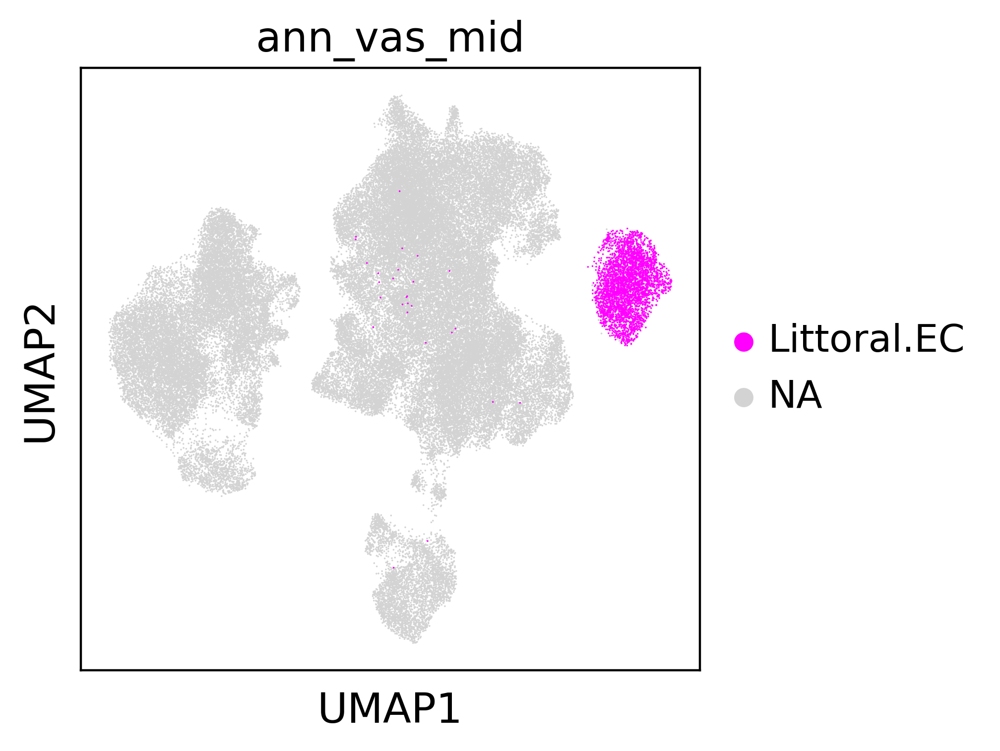

In [26]:
sc.pl.umap(adata, color = 'ann_vas_mid', groups = ["Littoral.EC"], palette = ['magenta'])

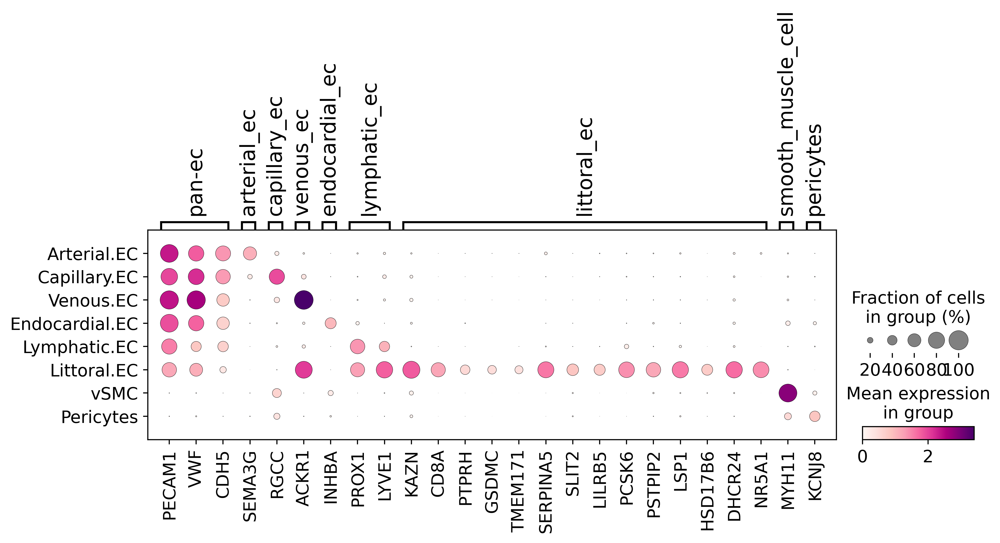

In [27]:
littoral_markers = {
    'pan-ec': ["PECAM1","VWF","CDH5"],
    'arterial_ec': ["SEMA3G"],
    'capillary_ec': ["RGCC"],
    'venous_ec': ["ACKR1"],
    'endocardial_ec': ["INHBA"],
    'lymphatic_ec': ["PROX1","LYVE1"],
    'littoral_ec': ["KAZN","CD8A","PTPRH","GSDMC","TMEM171","SERPINA5","SLIT2","LILRB5","PCSK6","PSTPIP2","LSP1","HSD17B6","DHCR24","NR5A1"],
    'smooth_muscle_cell': ["MYH11"],
    'pericytes': ["KCNJ8"],
}
#sc.pl.dotplot(spleen, littoral_markers, "ann_vas_mid", cmap = 'RdPu', swap_axes = False)
sc.pl.dotplot(adata, littoral_markers, "ann_vas_mid", cmap = 'RdPu', swap_axes = False)

## Lymphatic EC

In [29]:
lec = adata[adata.obs["ann_vas_mid"].isin(["Lymphatic.EC"])]

In [30]:
lec.obs['ann_merged_final'].cat.reorder_categories(["lec_cap","blec","clec","flec","pfslec","vlec_up","vlec_down"], inplace=True)

/var/tmp/pbs.8548809.pbs/ipykernel_3135920/702388838.py:1: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  lec.obs['ann_merged_final'].cat.reorder_categories(["lec_cap","blec","clec","flec","pfslec","vlec_up","vlec_down"], inplace=True)


In [31]:
lec_markers = {
    'lec': ["PECAM1","PROX1","CCL21","MMRN1","TBX1","TFF3","FLT4","LAYN"],
    'lec_cap': ["LYVE1","PDPN","RELN","LOX"],
    'lymph_node': ["NTS","ACKR3","TMOD1","EEF1G","PLA1A","C7"],
    'blec': ["ACKR4","SCUBE2","PCDH15"],
    'clec': ["TMEM100","THBS4","ADAMTS1"],
    'flec_pfslec': ["CCL14","CLEC4M","CLEC4G"],
    'flec': ["CXCL3","PLVAP","THY1"],
    'pfslec': ["MARCO","CD209","LGMN"],
    'vlec_up': ["NEO1","CD24","ADAMTS6"],
    'vlec_down': ["GJA4","HGF","SCG3"],

}

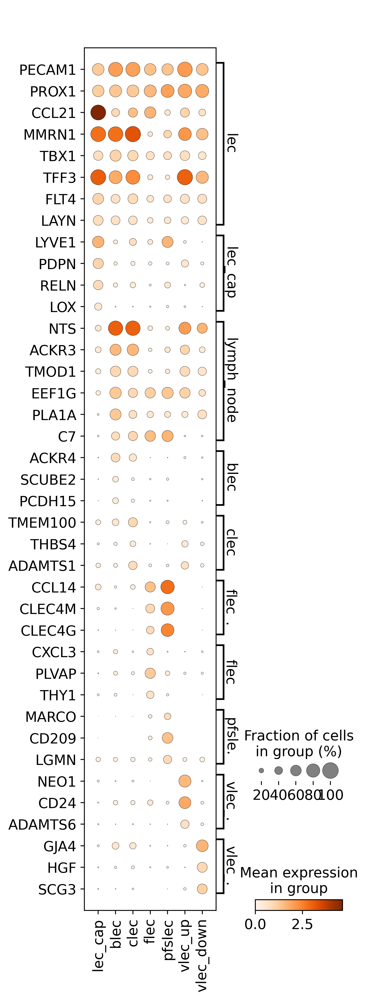

In [32]:
sc.pl.dotplot(lec, lec_markers, "ann_merged_final", cmap = 'Oranges', swap_axes = True)

## Pericytes & Vascular Smooth Muscle cells

In [33]:
adata_mural = adata[adata.obs["ann_vas_mid"].isin(["Pericytes","vSMC"])]

In [36]:
adata_mural

View of AnnData object with n_obs × n_vars = 19915 × 31402
    obs: 'id', 'organ', 'donor', 'kit', 'sorting', 'location', 'age', 'gender', 'dissociation', 'scrublet_score', 'doublet_bh_pval', 'published_annotation', 'HCA', 'batch', 'study', 'sample', 'cell_ontology_class', 'free_annotation', 'compartment', 'age2', 'barcode', 'concat_sample_no', 'Population ', 'hospital_id', 'Organ', 'doublet_pval', 'Project', 'broad_celltype', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'int_or_ext', 'leiden_scVI', 'organ_uni', 'uni_index', 'subsample', 'donor_organ', 'donor_location', 'numbering', 'ann_ec_2', 'scoring_cc_s', 'scoring_cc_m', 'scoring_cc', 'score_s_genes', 'score_g2m_genes', 'score_angio_genes', 'score_EMT_genes', 'score_MET_genes', 'score_stress_genes', 'ann_ec_av', 'ann_ec_size', 'ann_ec_cap', 'ann_ec_final', 'test', 'ann_vas_1', 'published_annotation_skin', 'int_ext', 'Cell_category', 'Predicted_labels_CellTypist', 'Maj

In [37]:
adata_mural.obs.ann_merged_final.value_counts()

art_smc              8928
cap_pc               6465
ven_smc_pc           1296
large_art_smc        1239
remodelling_mural     901
ven_smc               538
pul_pc                320
pul_smc               228
Name: ann_merged_final, dtype: int64

In [38]:
smc_markers = ["PDGFRB","NOTCH3","TPM2","MYH11","PLN","LMOD1","RGS5","ABCC9","KCNJ8","ADH1B","THBS2","RERGL","CASQ2","KCNAB1","TCF21","EGFL6","PERP","ELN","LTBP2","MYH10","CHRDL1","FST","PRUNE2","HMCN2","FLNC","CYFIP2"]
pc_markers = ["PDGFRB","NOTCH3","TPM2","MYH11","PLN","LMOD1","RGS5","ABCC9","KCNJ8","HIGD1B","AGT","CYGB","TCF21","EGFL6","PERP","PTN","KCNK3","LAMC3","FBLN1","CLEC2B","CFD","STEAP4","PROCR","FGF7","CLSTN2"]

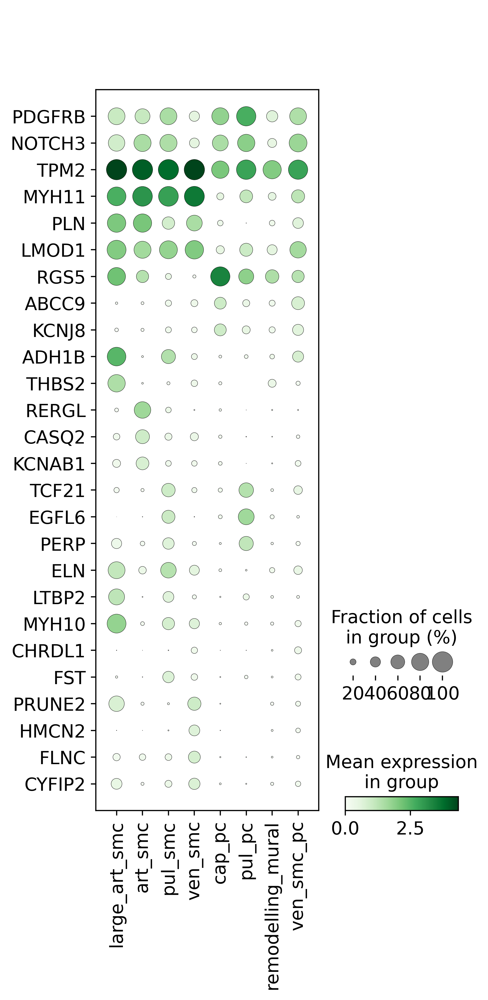

In [39]:
sc.pl.dotplot(adata_mural, smc_markers, "ann_merged_final", cmap = 'Greens', swap_axes = True)

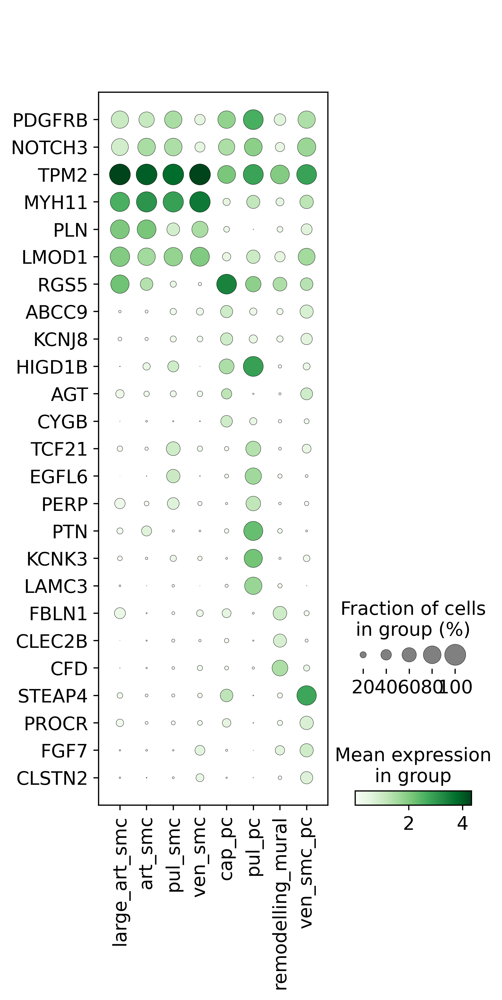

In [40]:
sc.pl.dotplot(adata_mural, pc_markers, "ann_merged_final", cmap = 'Greens', swap_axes = True)